## NYC Taxis

Data : NYC Taxis dataset 
Reference page : [nyc.gov - NYC Taxi & Limousine Commission](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page)  
Direct download link :  [January 2015](https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-01.csv)  

I originally followed the pyviz example (see below) that [uses data from Jan. 2015](https://s3.amazonaws.com/datashader-data/nyc_taxi_wide.parq) but having lat/lon coordinates converted into an unfamiliar cooridnates system.  
So I went directly to the original dataset.


Source : 
https://examples.pyviz.org/nyc_taxi/nyc_taxi.html



In [1]:
import pandas as pd
import datashader as ds, datashader.transfer_functions as tf, numpy as np
from datashader.utils import lnglat_to_meters
import geoviews as gv

In [2]:
dtypes = {"passenger_count" : float ,
          "pickup_longitude" :  float , 
          "pickup_latitude" :  float ,
          "dropoff_longitude" :  float ,
          "dropoff_latitude" :  float ,}

df = pd.read_csv("data/yellow_tripdata_2015-01.csv", 
                 usecols=list(dtypes.keys()), 
                 dtype=dtypes, 
                 header=0, 
                )

#df = df[ (df["pickup_latitude"] != 0) & (df["pickup_longitude"] != 0) ]

# NYC 
#   South West point 
swp = 40.56531328660712, -74.29631522055357
#   North East point : 
nep = 41.051897408607935, -73.51999288697618

# zoomed 
swp = 40.603318344722034, -74.05534789252157
nep = 40.83328231404271, -73.70097139960065

pickup_lat_filter = (df["pickup_latitude"] >= swp[0]) & (df["pickup_latitude"] <= nep[0])
pickup_lon_filter = (df["pickup_longitude"] >= swp[1]) & (df["pickup_longitude"] <= nep[1])

dropoff_lat_filter = (df["dropoff_latitude"] >= swp[0]) & (df["dropoff_latitude"] <= nep[0])
dropoff_lon_filter = (df["dropoff_longitude"] >= swp[1]) & (df["dropoff_longitude"] <= nep[1])

df = df[ pickup_lat_filter  &
         pickup_lon_filter  &
         dropoff_lat_filter &
         dropoff_lon_filter ]

In [3]:
# converts  lat/lon to y/x values, needed for the map
pickup_x, pickup_y = lnglat_to_meters(df.pickup_longitude, df.pickup_latitude)
dropoff_x, dropoff_y = lnglat_to_meters(df.dropoff_longitude, df.dropoff_latitude)

df = df.join( pd.DataFrame({   'pickup_x':pickup_x,
                          'pickup_y':pickup_y,
                          'dropoff_x':dropoff_x,
                          'dropoff_y':dropoff_y,  
                      })  )

In [4]:
df.head()

,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,pickup_x,pickup_y,dropoff_x,dropoff_y
0,1.0,-73.993896,40.750111,-73.974785,40.750618,-8.236963e+06,4.975553e+06,-8.234835e+06,4.975627e+06
1,1.0,-74.001648,40.724243,-73.994415,40.759109,-8.237826e+06,4.971752e+06,-8.237021e+06,4.976875e+06
2,1.0,-73.963341,40.802788,-73.951820,40.824413,-8.233561e+06,4.983296e+06,-8.232279e+06,4.986477e+06
3,1.0,-74.009087,40.713818,-74.004326,40.719986,-8.238654e+06,4.970221e+06,-8.238124e+06,4.971127e+06
4,1.0,-73.971176,40.762428,-74.004181,40.742653,-8.234434e+06,4.977363e+06,-8.238108e+06,4.974457e+06


In [5]:
df.describe() 

,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,pickup_x,pickup_y,dropoff_x,dropoff_y
count,1.231696e+07,1.231696e+07,1.231696e+07,1.231696e+07,1.231696e+07,1.231696e+07,1.231696e+07,1.231696e+07,1.231696e+07
mean,1.687229e+00,-7.397492e+01,4.075093e+01,-7.397459e+01,4.075099e+01,-8.234850e+06,4.975675e+06,-8.234814e+06,4.975683e+06
std,1.344198e+00,3.503168e-02,2.654910e-02,3.132552e-02,2.864384e-02,3.899709e+03,3.900393e+03,3.487141e+03,4.208319e+03
min,0.000000e+00,-7.405530e+01,4.060339e+01,-7.405534e+01,4.060332e+01,-8.243798e+06,4.954017e+06,-8.243803e+06,4.954007e+06
25%,1.000000e+00,-7.399191e+01,4.073712e+01,-7.399139e+01,4.073587e+01,-8.236742e+06,4.973644e+06,-8.236683e+06,4.973460e+06
50%,1.000000e+00,-7.398198e+01,4.075382e+01,-7.398040e+01,4.075407e+01,-8.235636e+06,4.976098e+06,-8.235460e+06,4.976134e+06
75%,2.000000e+00,-7.396807e+01,4.076777e+01,-7.396471e+01,4.076862e+01,-8.234088e+06,4.978147e+06,-8.233713e+06,4.978272e+06
max,9.000000e+00,-7.370126e+01,4.083328e+01,-7.370097e+01,4.083328e+01,-8.204387e+06,4.987781e+06,-8.204355e+06,4.987781e+06


----

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
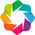

In [6]:
import holoviews as hv
import holoviews.operation.datashader as hd
from datashader.colors import Hot
hv.extension('bokeh')

In [7]:
int(df.pickup_x.min()/1000)*1000

-8243000

----
### First attempt : displaying both pickups and dropoffs

Not very satisfying though. There's another attempt further

In [21]:
# shade from branded color #A43A8F plum) to #FFFFFF (excluded)
pickup_colors = [ "#A43A8F", 
                 "#AC4C99", "#B55EA3", "#BD70AE", "#C582B8", "#CD94C2", "#D6A5CC", "#DEB7D6", "#E6C9E0", "#EEDBEB", 
                 "#F7EDF5",
                ]

# shade from branded color #99C941 (green) to #FFFFFF (excluded)
dropoff_colors = [ "#99C941", 
                 "#A2CE52", "#ACD364", "#B5D875", "#BEDD86", "#C7E297", "#D1E6A9", "#DAEBBA", "#E3F0CB", "#ECF5DC", 
                 "#F6FAEE",
                ][::-1]


pickup_points = hv.Points(df, kdims=['pickup_x', 'pickup_y'],)
dropoff_points = hv.Points(df, kdims=['dropoff_x', 'dropoff_y'],)

pickup_shade = hv.operation.datashader.datashade(pickup_points,
                                             x_sampling=1, 
                                             y_sampling=1,
                                             aggregator=ds.sum('passenger_count'),
                                             cmap=pickup_colors,
                                            )

dropoff_shade = hv.operation.datashader.datashade(dropoff_points,
                                             x_sampling=1, 
                                             y_sampling=1,
                                             aggregator=ds.sum('passenger_count'),
                                             cmap=dropoff_colors,
                                              alpha = 128
                                            )

min_x, min_y = lnglat_to_meters(swp[1], swp[0])
max_x, max_y = lnglat_to_meters(nep[1], nep[0])

background = hv.element.tiles.CartoLight().redim.range(y=(min_y, max_y)) 

(background * pickup_shade * dropoff_shade ).opts(
                                #width=1440, 
                                #height=900,
                                width=720, 
                                height=450,
                                xaxis=None,
                                yaxis=None,
                            ) 

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [pickup_x,pickup_y]   (R,G,B,A)
      .RGB.II  :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

### 

In [10]:
def hex_to_RGB(hex):
    return [int(hex[i:i+2], 16) for i in range(1,6,2)]

def RGB_to_hex(RGB):
    RGB = [int(x) for x in RGB]
    return "#"+"".join(["0{0:x}".format(v) if v < 16 else
                        "{0:x}".format(v) for v in RGB])


def color_scale(from_hex, to_hex, n=10):
    
    from_rgb = hex_to_RGB(from_hex)
    to_rgb = hex_to_RGB(to_hex)
    
    result = [from_hex]

    for i in range(1, n):
        new_color = [
            int(from_rgb[j] + (float(i)/(n-1))*(to_rgb[j]-from_rgb[j]))
            for j in range(3)
        ]

        result.append( RGB_to_hex(new_color))

    return result

In [34]:

def make_plot(df, colormap, background):
    pickup_points = hv.Points(df, kdims=['pickup_x', 'pickup_y'],)
    dropoff_points = hv.Points(df, kdims=['dropoff_x', 'dropoff_y'],)

    total_shade = hv.operation.datashader.datashade(pickup_points*dropoff_points,
                                                 x_sampling=1, 
                                                 y_sampling=1,
                                                 aggregator=ds.sum('passenger_count'),
                                                 cmap=colormap,
                                                 alpha=192
                                                )
    min_x, min_y = lnglat_to_meters(swp[1], swp[0])
    max_x, max_y = lnglat_to_meters(nep[1], nep[0])

    background = background.redim.range(y=(min_y, max_y))

    result = (background * total_shade ).opts(
                                    width=1440, 
                                    height=900,
                                    #width=720, 
                                    #height=450,
                                    xaxis=None,
                                    yaxis=None,
                                )

    return result 

plum = "#A43A8F"
green = "#99C941"
blue_magenta = "#452392"
violet = "#A183E6"
cyan = "#74D6E5"


# shades of purple
#colormap = color_scale(violet, plum) + color_scale(plum, "#FFFFFF", 12)[:6]
#result_purple = make_plot(df, colormap, hv.element.tiles.CartoDark())

# shades from plum to green - not great
#colormap = color_scale(plum, green) + color_scale(green, "#FFFFFF", 12)[:6] # we don't take the last half to avoid having too white-ish shades
#result_plumgreen = make_plot(df, colormap, hv.element.tiles.CartoDark())

# shades of green 
colorscale_length = 19
colormap_green = color_scale(green, "#FFFFFF", colorscale_length) [:-4]
colormap_plum = color_scale(plum, "#FFFFFF", colorscale_length) [:-4]
colormap_blue_magenta = color_scale(blue_magenta, "#FFFFFF", colorscale_length) [:-4]
colormap_violet = color_scale(violet, "#FFFFFF", colorscale_length) [:-4]
colormap_cyan = color_scale(cyan, "#FFFFFF", colorscale_length) [:-4]

result_green = make_plot(df,  
                          colormap_green,
                          hv.element.tiles.CartoDark())
result_plum = make_plot(df,  
                        colormap_plum,
                        hv.element.tiles.CartoDark())
result_blue_magenta = make_plot(df,  
                                colormap_blue_magenta,
                                 hv.element.tiles.CartoDark())
result_violet = make_plot(df,  
                          colormap_violet,
                           hv.element.tiles.CartoDark())
result_cyan = make_plot(df,  
                      colormap_cyan,
                         hv.element.tiles.CartoDark())


print("done")

done


In [35]:
# VERY IMPORTANT !
# before saving the result images (see in the next cells), 
# we MUST show the result in jlab so datashader loads enough points and makes a precise enough image

result_green

:DynamicMap   []
   :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Points.I  :RGB   [pickup_x,pickup_y]   (R,G,B,A)
      .Points.II :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

In [36]:
result_plum

:DynamicMap   []
   :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Points.I  :RGB   [pickup_x,pickup_y]   (R,G,B,A)
      .Points.II :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

In [37]:
result_blue_magenta

:DynamicMap   []
   :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Points.I  :RGB   [pickup_x,pickup_y]   (R,G,B,A)
      .Points.II :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

In [38]:
result_violet

:DynamicMap   []
   :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Points.I  :RGB   [pickup_x,pickup_y]   (R,G,B,A)
      .Points.II :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

In [39]:
result_cyan

:DynamicMap   []
   :Overlay
      .Tiles.I   :Tiles   [x,y]
      .Points.I  :RGB   [pickup_x,pickup_y]   (R,G,B,A)
      .Points.II :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

In [ ]:

# warning : sometimes the rendering with hv.save below adds a content-inset, which results in a border without any point.
# Alternative : save images one by one using the save button of Bokeh

In [40]:
# Ok, now we can save the images
# you may need to run the following : 
# pip install selenium
# conda install -c conda-forge firefox geckodriver

hv.save(result_green, 'exports_20220602/nyc_dark_green_zoomed.png', fmt='png')
hv.save(result_plum, 'exports_20220602/nyc_dark_plum_zoomed.png', fmt='png')
hv.save(result_blue_magenta, 'exports_20220602/nyc_dark_blue_magenta_zoomed.png', fmt='png')
hv.save(result_violet, 'exports_20220602/nyc_dark_violet_zoomed.png', fmt='png')
hv.save(result_cyan, 'exports_20220602/nyc_dark_cyan_zoomed.png', fmt='png')